In [1]:
import osmnx as ox
import matplotlib.pyplot as plt
import folium

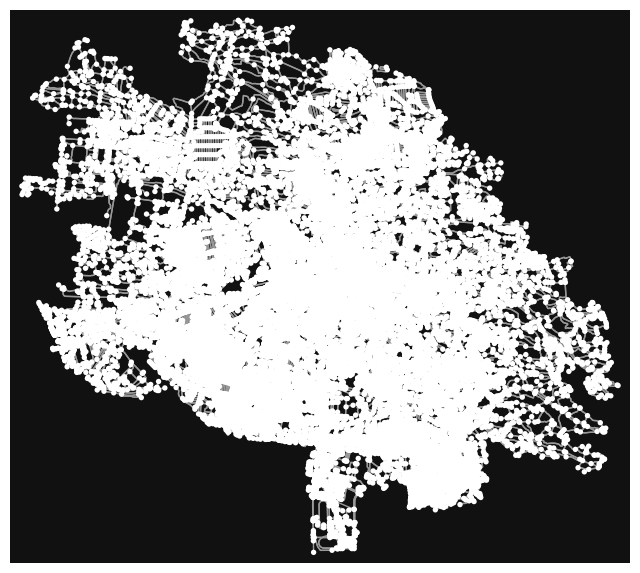

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [2]:
ox.plot_graph(ox.graph_from_place('Lviv, Ukraine'))

In [3]:
G = ox.graph_from_place('Lviv, Ukraine', network_type="drive")
G

In [5]:
#ox.plot_graph_folium(G)

# Get the centroid coordinates of the nodes to center the map
nodes = ox.graph_to_gdfs(G, nodes=True, edges=False)
center_latlng = nodes.unary_union.centroid.coords[0]
center_lat, center_lng = center_latlng[1], center_latlng[0]

# Create a Folium map centered on the graph
m = folium.Map(location=[center_lat, center_lng], zoom_start=12)

# Convert graph edges to GeoDataFrame and add them as GeoJSON to the map
edges = ox.graph_to_gdfs(G, nodes=False)
folium.GeoJson(edges).add_to(m)

# Display the interactive map
m

C:\Users\Dmitry\AppData\Local\Temp\ipykernel_13944\206828666.py:5: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  center_latlng = nodes.unary_union.centroid.coords[0]


In [6]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)
gdf_nodes.head()

,y,x,street_count,highway,railway,ref,junction,geometry
osmid,,,,,,,,
30508647,49.822245,23.973219,3,NaN,NaN,NaN,NaN,POINT (23.97322 49.82225)
30508651,49.827064,23.982754,4,traffic_signals,NaN,NaN,NaN,POINT (23.98275 49.82706)
30508663,49.825149,23.988873,3,NaN,NaN,NaN,NaN,POINT (23.98887 49.82515)
30508665,49.825836,23.990868,3,NaN,NaN,NaN,NaN,POINT (23.99087 49.82584)
30508679,49.834410,24.006417,3,NaN,NaN,NaN,NaN,POINT (24.00642 49.83441)


In [7]:
gdf_edges.head()

osmid      highway  \
u        v          key                                                   
30508647 1660535520 0                             33868674  residential   
         261710438  0    [161248896, 285692739, 374773227]    secondary   
         267160516  0               [693078462, 467982679]    secondary   
30508651 8328640415 0                           1062676773    secondary   
         373161838  0                             33075644    secondary   

                          lanes                   name  oneway reversed  \
u        v          key                                                   
30508647 1660535520 0         1  вулиця Вука Караджича   False     True   
         261710438  0    [4, 6]       Любінська вулиця   False     True   
         267160516  0    [4, 6]       Любінська вулиця   False    False   
30508651 8328640415 0         5       Любінська вулиця   False    False   
         373161838  0         2         Окружна вулиця    True    False   

                             length  \
u        v          key               
30508647 1660535520 0    198.786795   
         261710438  0    353.548128   
         267160516  0    357.259125   
30508651 8328640415 0     61.530303   
         373161838  0    373.224136   

                                                                  geometry  \
u        v          key                                                      
30508647 1660535520 0    LINESTRING (23.97322 49.82225, 23.97309 49.822...   
         261710438  0    LINESTRING (23.97322 49.82225, 23.97262 49.822...   
         267160516  0    LINESTRING (23.97322 49.82225, 23.97324 49.822...   
30508651 8328640415 0    LINESTRING (23.98275 49.82706, 23.98212 49.82669)   
         373161838  0    LINESTRING (23.98275 49.82706, 23.98256 49.827...   

                        maxspeed  ref bridge width access junction tunnel  
u        v          key                                                    
30508647 1660535520 0        NaN  NaN    NaN   NaN    NaN      NaN    NaN  
         261710438  0         50  NaN    NaN   NaN    NaN      NaN    NaN  
         267160516  0         50  NaN    NaN   NaN    NaN      NaN    NaN  
30508651 8328640415 0         50  NaN    NaN   NaN    NaN      NaN    NaN  
         373161838  0        NaN  NaN    NaN   NaN    NaN      NaN    NaN

In [9]:
#gdf = ox.geometries_from_place("Kyiv, Ukraine", {"amenity": True, "building": True, "highway": True})
tags = {"amenity": True, "building": True, "highway": True}
gdf = ox.features_from_place("Kyiv, Ukraine", tags)

In [10]:
gdf.head()

geometry          highway button_operated  \
element id                                                                     
node    10980674  POINT (30.50581 50.43455)  traffic_signals             NaN   
        10980679  POINT (30.51843 50.43595)  traffic_signals              no   
        10980707  POINT (30.53655 50.44709)  traffic_signals              no   
        10980710  POINT (30.53982 50.44531)  traffic_signals             NaN   
        10980711   POINT (30.5416 50.44434)         crossing              no   

                         crossing crossing_ref traffic_signals:sound  \
element id                                                             
node    10980674              NaN          NaN                   NaN   
        10980679  traffic_signals        zebra                    no   
        10980707  traffic_signals          NaN                    no   
        10980710              NaN          NaN                   NaN   
        10980711  traffic_signals          NaN                    no   

                 traffic_signals:vibration crossing:island traffic_signals  \
element id                                                                   
node    10980674                       NaN             NaN             NaN   
        10980679                        no             NaN             NaN   
        10980707                        no             NaN             NaN   
        10980710                       NaN             NaN             NaN   
        10980711                        no              no             NaN   

                 direction  ... refugee disused:healthcare operator:old  \
element id                  ...                                           
node    10980674       NaN  ...     NaN                NaN          NaN   
        10980679       NaN  ...     NaN                NaN          NaN   
        10980707       NaN  ...     NaN                NaN          NaN   
        10980710       NaN  ...     NaN                NaN          NaN   
        10980711       NaN  ...     NaN                NaN          NaN   

                 payment:discover_card community name:af source:name:de  \
element id                                                                
node    10980674                   NaN       NaN     NaN            NaN   
        10980679                   NaN       NaN     NaN            NaN   
        10980707                   NaN       NaN     NaN            NaN   
        10980710                   NaN       NaN     NaN            NaN   
        10980711                   NaN       NaN     NaN            NaN   

                 source:name:en source:name:fr geonames:id  
element id                                                  
node    10980674            NaN            NaN         NaN  
        10980679            NaN            NaN         NaN  
        10980707            NaN            NaN         NaN  
        10980710            NaN            NaN         NaN  
        10980711            NaN            NaN         NaN  

[5 rows x 1286 columns]

In [11]:
gdf['highway'].unique()

array(['traffic_signals', 'crossing', 'motorway_junction', 'give_way',
       'mini_roundabout', 'turning_circle', nan, 'bus_stop',
       'street_lamp', 'speed_camera', 'stop', 'traffic_signals;crossing',
       'elevator', 'rest_area', 'turning_loop', 'services',
       'traffic_mirror', 'milestone', 'raceway', 'cyclist_waiting_aid',
       'platform', 'pedestrian', 'service', 'footway', 'secondary',
       'residential', 'primary', 'tertiary', 'trunk', 'trunk_link',
       'primary_link', 'construction', 'secondary_link', 'unclassified',
       'tertiary_link', 'living_street', 'proposed', 'steps', 'path',
       'track', 'cycleway', 'motorway_link', 'bridleway', 'motorway',
       'closed', 'corridor', 'road'], dtype=object)

In [12]:
gdf['amenity'].unique()

array([nan, 'school', 'pub', 'dentist', 'post_office', 'cafe',
       'restaurant', 'atm', 'bench', 'pharmacy', 'fast_food', 'fuel',
       'parking', 'toilets', 'bank', 'cinema', 'water_point',
       'drinking_water', 'clinic', 'car_wash', 'bureau_de_change',
       'university', 'fountain', 'arts_centre', 'place_of_worship',
       'kindergarten', 'library', 'bar', 'post_box', 'theatre', 'studio',
       'recycling', 'waste_disposal', 'bicycle_rental', 'taxi',
       'nightclub', 'stripclub', 'veterinary', 'music_school',
       'vending_machine', 'police', 'doctors', 'parking_entrance',
       'car_sharing', 'townhall', 'hospital', 'office', 'waste_basket',
       'social_facility', 'community_centre', 'bicycle_parking',
       'parcel_locker', 'college', 'driving_school', 'food_court',
       'ticket_validator', 'shelter', 'marketplace', 'boat_rental',
       'money_transfer', 'payment_terminal', 'agency', 'parking_space',
       'hookah_lounge', 'clock', 'beauty', 'bus_station', 

In [13]:
gdf['building'].unique()

array([nan, 'commercial', 'church', 'yes', 'kiosk', 'pavilion', 'bunker',
       'dormitory', 'university', 'retail', 'hospital', 'house',
       'industrial', 'chapel', 'service', 'shed', 'garage', 'temple',
       'roof', 'residential', 'ruins', 'garages', 'construction',
       'apartments', 'office', 'school', 'kindergarten', 'sports_centre',
       'detached', 'government', 'college', 'stadium', 'public',
       'guardhouse', 'train_station', 'manufacture', 'farm_auxiliary',
       'greenhouse', 'cathedral', 'civic', 'parking', 'grandstand',
       'hotel', 'terrace', 'hangar', 'fire_station', 'warehouse',
       'transportation', 'shop', 'clinic', 'collapsed', 'barn', 'toilets',
       'mall', 'synagogue', 'music_school', 'supermarket',
       'semidetached_house', 'gatehouse', 'shrine', 'administrative',
       'stands', 'greenhouse_horticulture', 'bridge', 'cabin',
       'water_tower', 'religious', 'movie_studio', 'allotment_house',
       'boathouse', 'houseboat', 'static_car

In [14]:
gdf['building'].value_counts()

building
yes              60587
apartments       12059
house             5576
industrial        2130
garages           1978
                 ...  
floating_home        1
market               1
yes;retail           1
bandstand            1
retail;yes           1
Name: count, Length: 94, dtype: int64

In [15]:
a = gdf['amenity'].value_counts()
a[a.index=='school']

amenity
school    547
Name: count, dtype: int64

In [16]:
gdf[gdf["building"].isin(['residential', 'apartments', 'house'])]

geometry highway  \
element id                                                                      
node    3344152314                          POINT (30.61897 50.38042)     NaN   
        3344152315                          POINT (30.61886 50.38022)     NaN   
        3344152316                          POINT (30.61319 50.37982)     NaN   
        3344152317                          POINT (30.61324 50.37966)     NaN   
        3353489663                          POINT (30.60943 50.37943)     NaN   
...                                                               ...     ...   
way     1366283832  POLYGON ((30.61057 50.37607, 30.6106 50.37595,...     NaN   
        1366283835  POLYGON ((30.61076 50.37533, 30.61093 50.37534...     NaN   
        1366283836  POLYGON ((30.6109 50.37485, 30.61093 50.37471,...     NaN   
        1368070858  POLYGON ((30.44341 50.51471, 30.44346 50.5147,...     NaN   
        1370668908  POLYGON ((30.50824 50.46111, 30.50807 50.4612,...     NaN   

                   button_operated crossing crossing_ref  \
element id                                                 
node    3344152314             NaN      NaN          NaN   
        3344152315             NaN      NaN          NaN   
        3344152316             NaN      NaN          NaN   
        3344152317             NaN      NaN          NaN   
        3353489663             NaN      NaN          NaN   
...                            ...      ...          ...   
way     1366283832             NaN      NaN          NaN   
        1366283835             NaN      NaN          NaN   
        1366283836             NaN      NaN          NaN   
        1368070858             NaN      NaN          NaN   
        1370668908             NaN      NaN          NaN   

                   traffic_signals:sound traffic_signals:vibration  \
element id                                                           
node    3344152314                   NaN                       NaN   
        3344152315                   NaN                       NaN   
        3344152316                   NaN                       NaN   
        3344152317                   NaN                       NaN   
        3353489663                   NaN                       NaN   
...                                  ...                       ...   
way     1366283832                   NaN                       NaN   
        1366283835                   NaN                       NaN   
        1366283836                   NaN                       NaN   
        1368070858                   NaN                       NaN   
        1370668908                   NaN                       NaN   

                   crossing:island traffic_signals direction  ... refugee  \
element id                                                    ...           
node    3344152314             NaN             NaN       NaN  ...     NaN   
        3344152315             NaN             NaN       NaN  ...     NaN   
        3344152316             NaN             NaN       NaN  ...     NaN   
        3344152317             NaN             NaN       NaN  ...     NaN   
        3353489663             NaN             NaN       NaN  ...     NaN   
...                            ...             ...       ...  ...     ...   
way     1366283832             NaN             NaN       NaN  ...     NaN   
        1366283835             NaN             NaN       NaN  ...     NaN   
        1366283836             NaN             NaN       NaN  ...     NaN   
        1368070858             NaN             NaN       NaN  ...     NaN   
        1370668908             NaN             NaN       NaN  ...     NaN   

                   disused:healthcare operator:old payment:discover_card  \
element id                                                                 
node    3344152314                NaN          NaN                   NaN   
        3344152315                NaN          NaN                   NaN   
        3

In [17]:
gdf[['place']]

place
element id              
node    10980674     NaN
        10980679     NaN
        10980707     NaN
        10980710     NaN
        10980711     NaN
...                  ...
way     1371943127   NaN
        1371960757   NaN
        1371986295   NaN
        1371986296   NaN
        1372034992   NaN

[403643 rows x 1 columns]

In [18]:
schools = gdf[gdf["amenity"] == "school"]
hospitals = gdf[gdf["amenity"] == "hospital"]
roads = gdf[gdf["highway"].isin(['primary', 'secondary', 'road', 'residential', 'pedestrian'])]
residential = gdf[gdf["building"].isin(['residential', 'apartments', 'house'])]

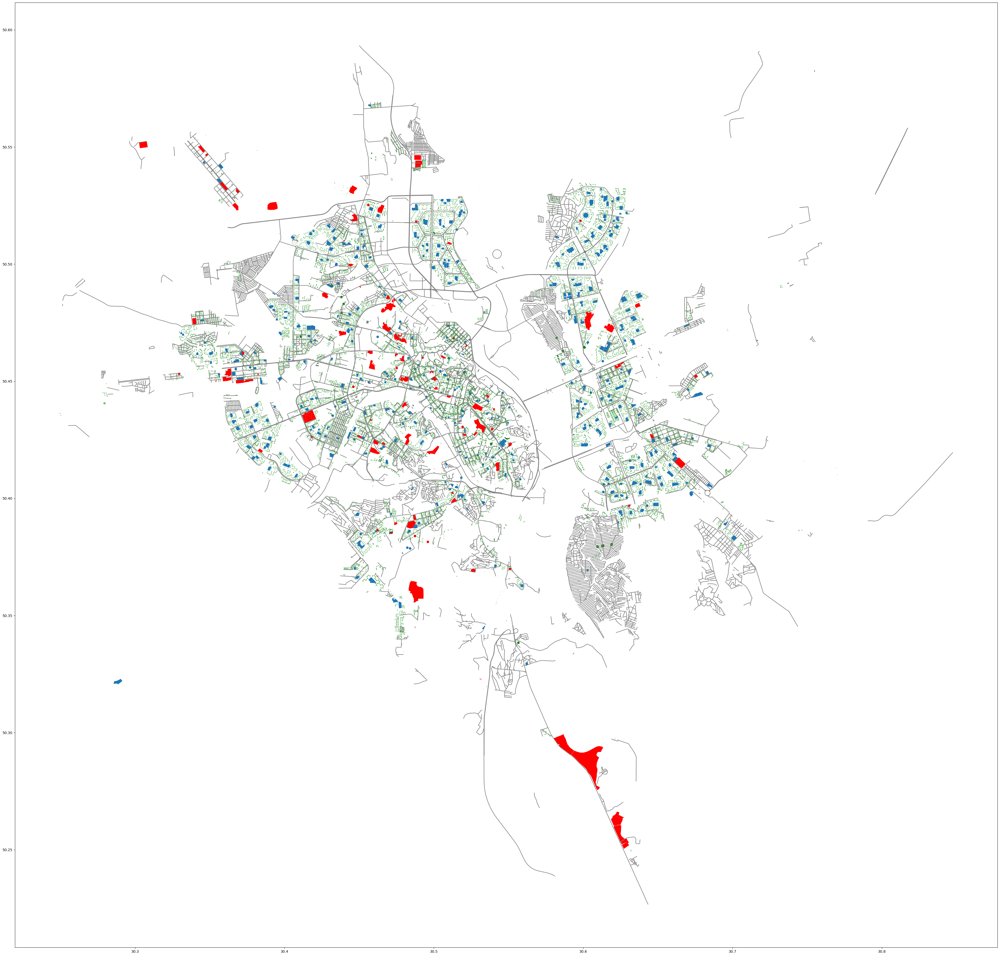

In [19]:
fig, ax = plt.subplots()
ax.set_aspect('equal')
schools.plot(ax=ax, figsize=(50,50))
hospitals.plot(ax=ax, figsize=(50,50), color='red')
roads.plot(ax=ax, figsize=(50,50), color='grey')
residential.plot(ax=ax, figsize=(50,50), color='green')

fig.set_figwidth(50)
fig.set_figheight(50)
plt.show()

<Axes: >

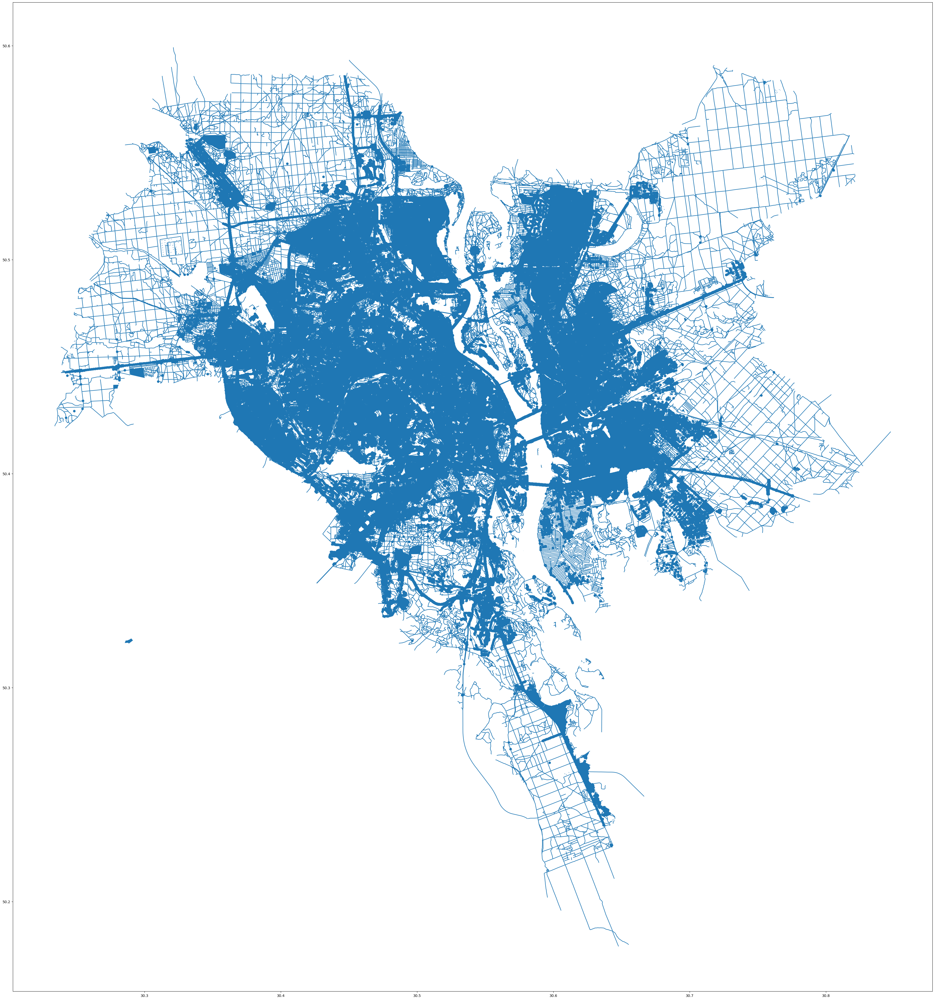

In [20]:
gdf.plot(figsize=(50,50), legend=True)